<a href="https://colab.research.google.com/github/kfahn22/computer-vision-course/blob/synthetic-data-creation-lung-images/Synthetic_lung_images_hf_course.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Using DCGAN to Generate Synthetic Lung Images

* DCGAN was proposed in [Unsupervised Representation Learning with Deep Convolutional Generative Adversarial Networks](https://arxiv.org/abs/1511.06434) by Radford, et al.

In this notebook we will:

* Download lung Xray images from the Hugging Face Hub
* Prepocess the images
* Use DCGAN to generate synthetic images
* Visualize the training process

* This demo notebook has been adapted from [here](https://github.com/ovh/ai-training-examples/blob/main/notebooks/computer-vision/image-generation/miniconda/dcgan-image-generation/notebook_chest_image_generation_dcgan.ipynb) and [here](https://github.com/huggingface/community-events/tree/main/huggan/pytorch/dcgan). The notebook ran for several hours using High-RAM.

### About the Dataset

#### Summary taken from [Identifying Medical Diagnoses and Treatable Diseases by Image-Based Deep Learning](https://www.cell.com/cell/fulltext/S0092-8674(18)30154-5?_returnURL=https%3A%2F%2Flinkinghub.elsevier.com%2Fretrieve%2Fpii%2FS0092867418301545%3Fshowall%3Dtrue):

* The dataset is organized into 3 folders (train, test, val) and contains subfolders for each image category (Pneumonia/Normal). There are 5,863 X-Ray images (JPEG) and 2 categories (Pneumonia/Normal).

* Chest X-ray images (anterior-posterior) were selected from retrospective cohorts of pediatric patients of one to five years old from Guangzhou Women and Children’s Medical Center, Guangzhou. All chest X-ray imaging was performed as part of patients’ routine clinical care.

* For the analysis of chest x-ray images, all chest radiographs were initially screened for quality control by removing all low quality or unreadable scans. The diagnoses for the images were then graded by two expert physicians before being cleared for training the AI system. In order to account for any grading errors, the evaluation set was also checked by a third expert.

[Dataset Source](https://data.mendeley.com/datasets/rscbjbr9sj/2)


### First, we will install the dependencies

In [1]:
!pip install -q datasets huggingface_hub datasets torch torchvision accelerate

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 521.2/521.2 kB 6.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 265.7/265.7 kB 10.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.3/115.3 kB 7.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 10.1 MB/s eta 0:00:00


### Next, we will download the dataset from the Hugging Face Hub.

In [ ]:
from datasets import load_dataset

# load the datset of lung images
dataset = load_dataset("hf-vision/chest-xray-pneumonia")

### Before running a model, it is always a good idea to explore the dataset a little bit.

We will start by finding the length of the dataset.

In [3]:
len(dataset['train'])

5216

Let's visualize the first 4 images of the dataset, which are labeled as "normal."

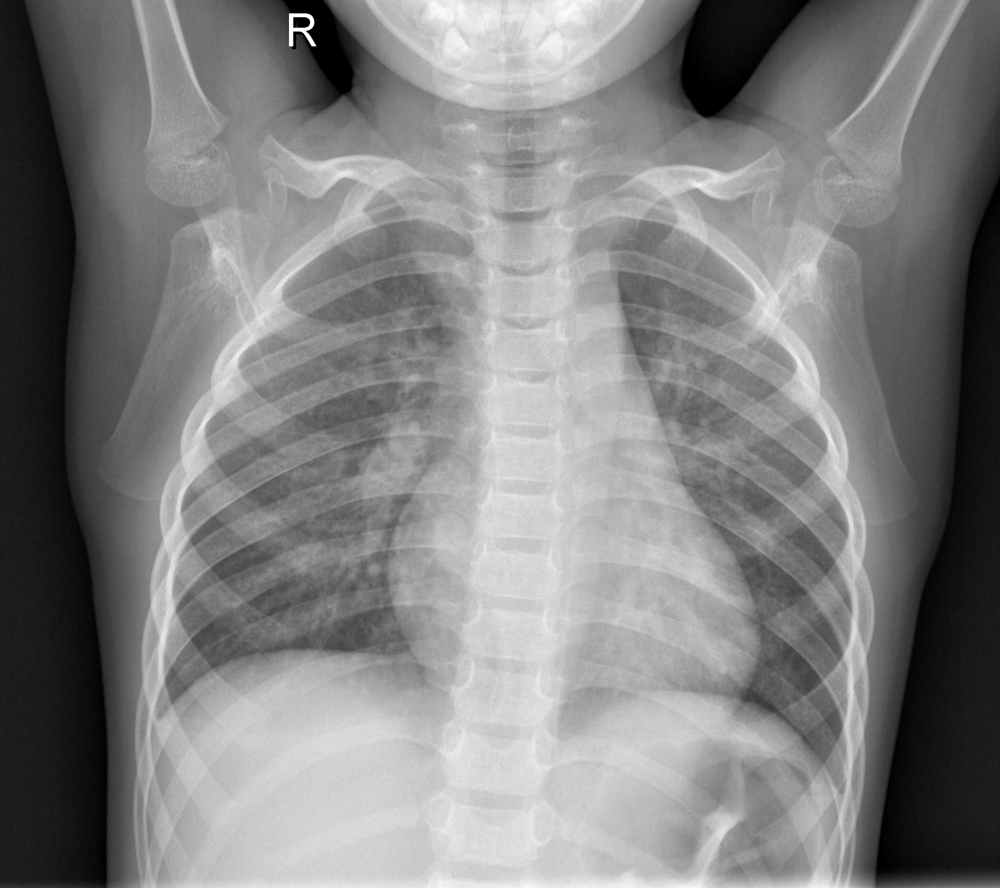

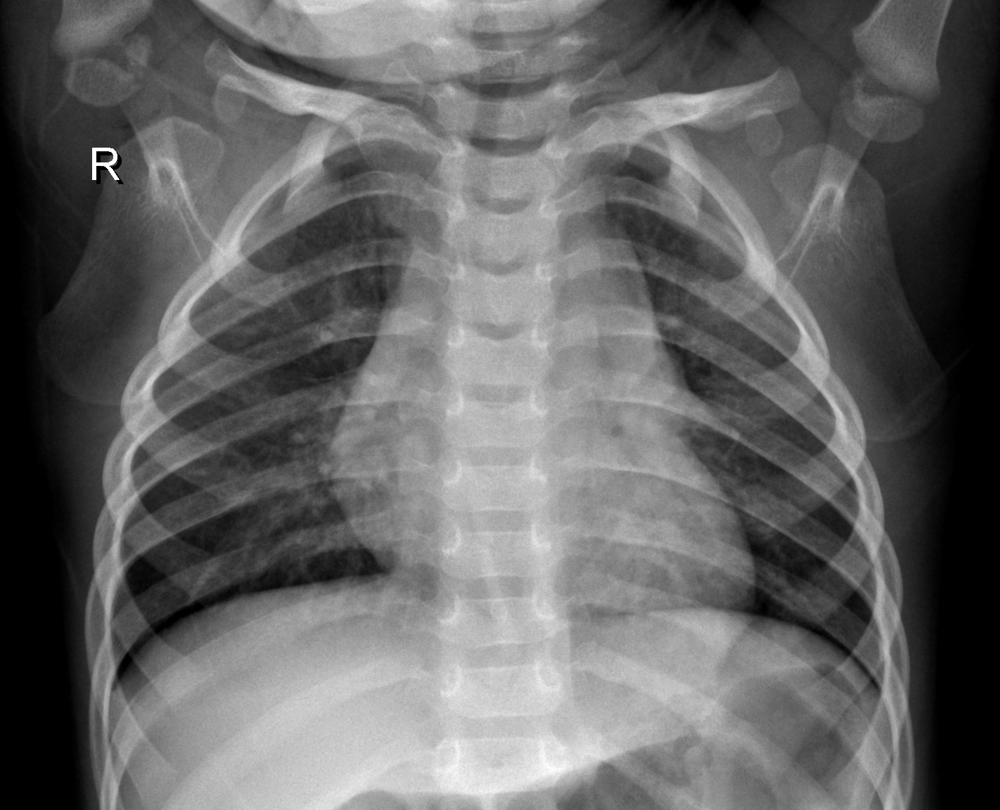

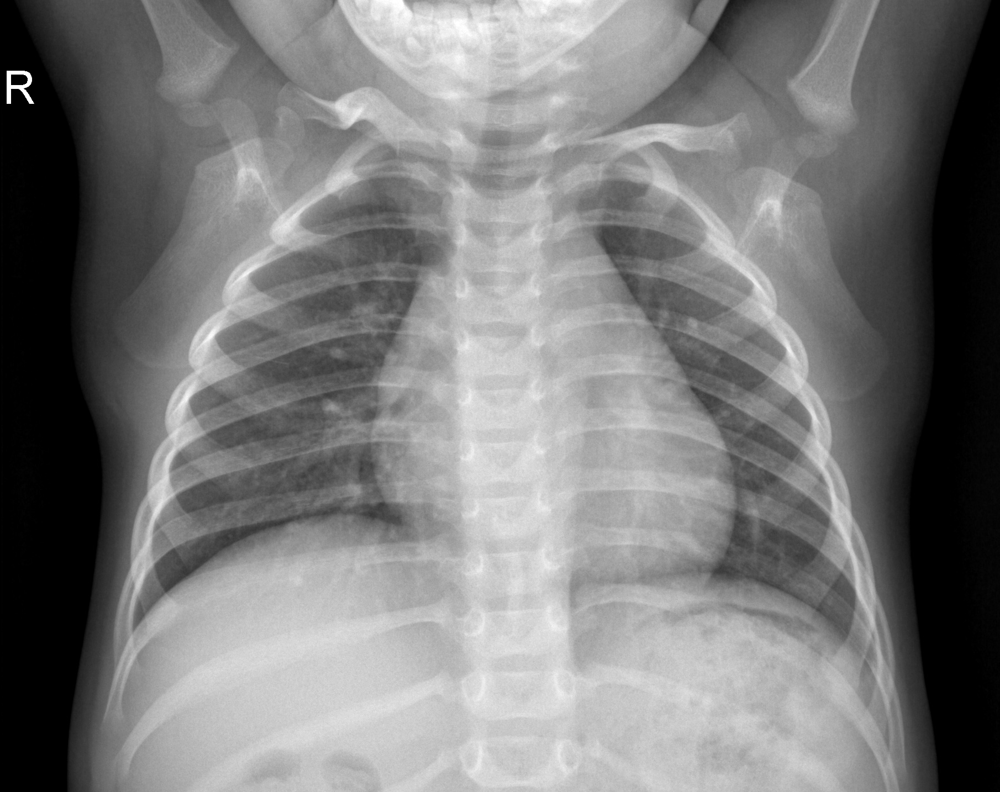

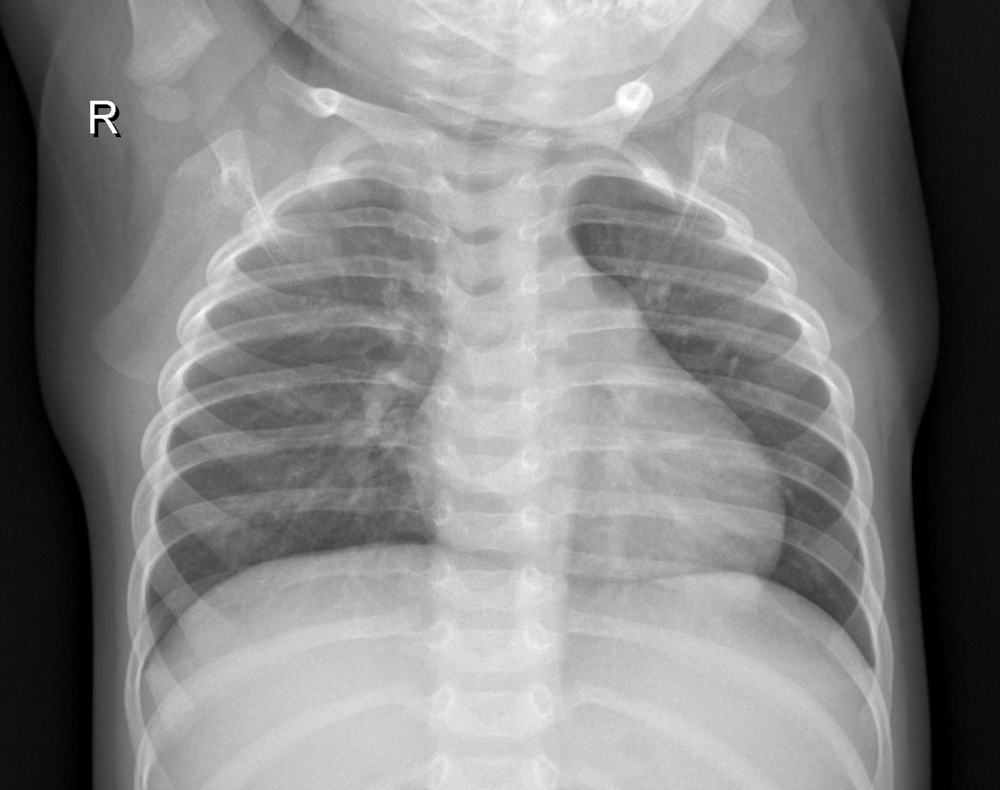

In [4]:
from PIL import Image
from IPython.display import display


# Display the image
for i in range(4):
     display(dataset["train"][i]['image'])

Now let's look at the last 4 images in the dataset, which are labeled "pneumonia."

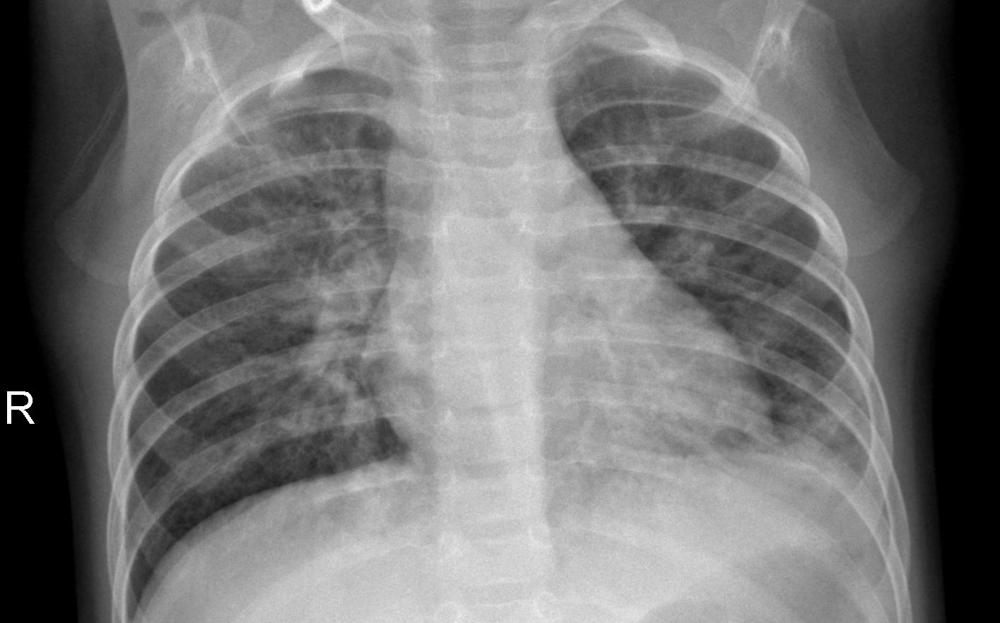

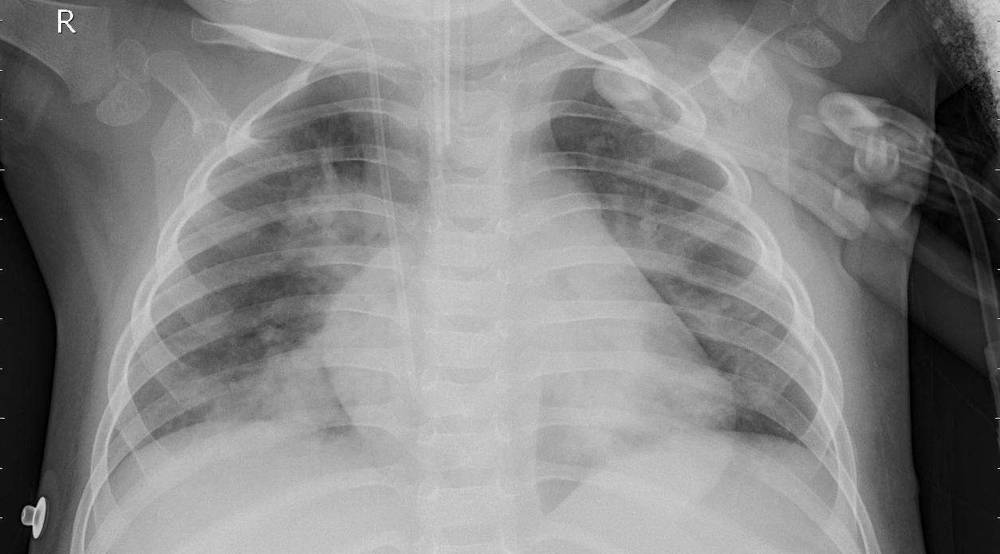

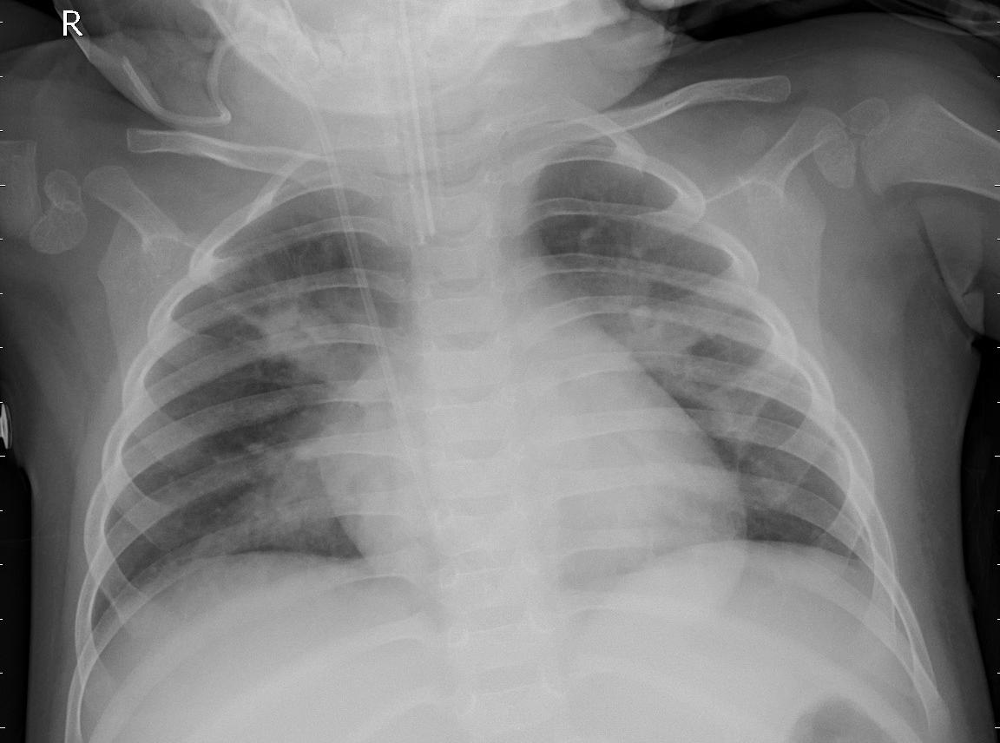

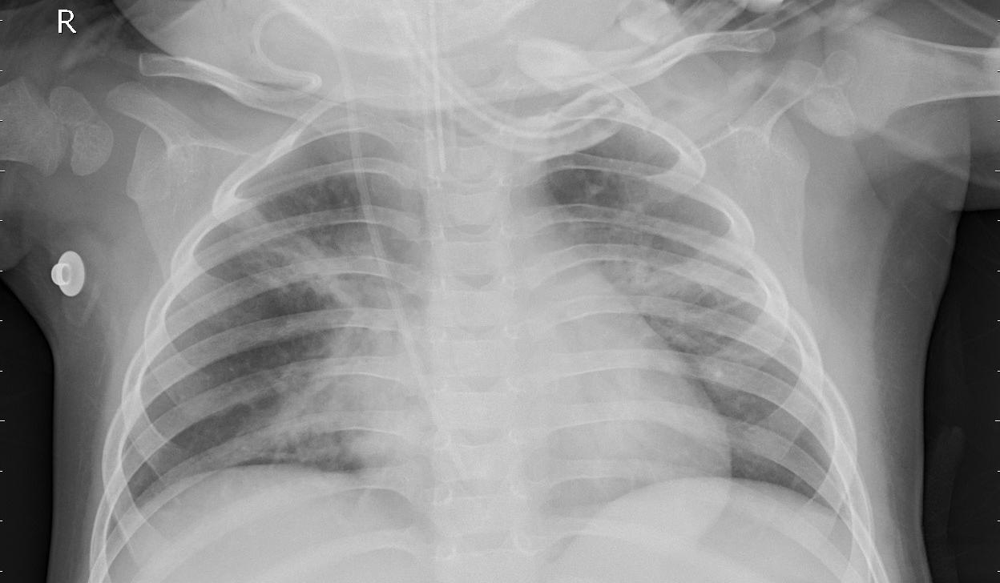

In [5]:
from PIL import Image
from IPython.display import display

# Display the image
for i in range(5211,5215):
     display(dataset["train"][i]['image'])


### We will import the necessary libraries

In [6]:
from IPython.display import HTML
import matplotlib.animation as animation
import matplotlib.pyplot as plt
import math
import numpy as np
import os
import random
import torch
import torch.nn as nn
import torch.optim as optim

from PIL import Image
import torchvision.transforms as transforms
from torchvision.transforms import CenterCrop, Compose, Normalize, Resize, ToTensor
import torchvision.utils as vutils
from torch.utils.data import DataLoader

### Now we will preprocess the data

* We will standarize the images using Resize and CenterCrop.

*  We will transform the images to tensors.

* We will normalize the data:

  * The mean of (0.5, 0.5, 0.5) ensures that the image data is roughly centered around zero. This can help in preventing issues related to vanishing or exploding gradients during training.
  * The standard deviation to (0.5, 0.5, 0.5), you scale the input data to be in the range of [-1, 1]. This range is often preferred for generator networks in GAN

In [7]:
batch_size = 128
nb_gpu = 1
nb_workers = 2 # based on system resources

# GPU or CPU (Not having at least 1 GPU can prevent code from working)
device = torch.device("cuda:0" if (torch.cuda.is_available() and nb_gpu > 0) else "cpu")
n_channels = 3
image_size = 64
input_shape = (image_size, image_size)

# Set a seed for reproducibility
seed = 22
random.seed(seed)
torch.manual_seed(seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

# define the transform
transform = Compose(
        [
            Resize(image_size),
            CenterCrop(image_size),
            ToTensor(),
            Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
        ]
)

# define function
def transforms(examples):
   examples["image"] = [transform(image.convert("RGB")) for image in examples["image"]]
   return examples

transformed_dataset = dataset.with_transform(transforms)

#create dataloader
dataloader = DataLoader(
     transformed_dataset["train"], batch_size=batch_size, shuffle=True, num_workers=nb_workers
)

real_batch = next(iter(dataloader))

## Now we will create the models

First, we define some parameters.

In [8]:
# Size of z latent vector (i.e. size of generator input), same size as described in the DCGAN paper
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 100

# Learning rate for optimizers, same value as described in the DCGAN paper
lr = 0.0002

# Beta1 hyperparameter for Adam optimizers, same value as described in the DCGAN paper
beta1 = 0.5

The model weights are randomly initialized from a Normal distribution with mean=0, stdev=0.02.
 These are applied to each layer of Generator and Discriminator.

In [9]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

### Define the Generator

In [10]:
# Generator Code
class Generator(nn.Module):
    def __init__(self, nb_gpu):
        super(Generator, self).__init__()
        self.nb_gpu = nb_gpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution

            nn.ConvTranspose2d(nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. ``(ngf*8) x 4 x 4``

            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. ``(ngf*4) x 8 x 8``

            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. ``(ngf*2) x 16 x 16``

            nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. ``(ngf) x 32 x 32``

            nn.ConvTranspose2d(ngf, n_channels, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. ``(nb_channels) x 64 x 64``
        )

    def forward(self, input):
        return self.main(input)

### Create the Generator

In [11]:
# Create the generator
gen_net = Generator(nb_gpu).to(device)

# Handle multi-GPU if desired
if (device.type == 'cuda') and (nb_gpu > 1):
    gen_net = nn.DataParallel(gen_net, list(range(nb_gpu)))

# Apply the ``weights_init`` function to randomly initialize all weights
gen_net.apply(weights_init)

# Print the model
print(gen_net)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


### Define the Discriminator

In [12]:
class Discriminator(nn.Module):
    def __init__(self, nb_gpu):
        super(Discriminator, self).__init__()
        self.nb_gpu = nb_gpu
        self.main = nn.Sequential(
            # input is ``(nb_channels) x 64 x 64``

            nn.Conv2d(n_channels, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf) x 32 x 32``

            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*2) x 16 x 16``

            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*4) x 8 x 8``

            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*8) x 4 x 4``

            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

### Create the Discriminator

In [13]:
# Create the Discriminator
disc_net = Discriminator(nb_gpu).to(device)

# Handle multi-GPU if desired
if (device.type == 'cuda') and (nb_gpu > 1):
    disc_net = nn.DataParallel(disc_net, list(range(nb_gpu)))

# Apply the ``weights_init`` function to randomly initialize all weights
# like this: ``to mean=0, stdev=0.2``.
disc_net.apply(weights_init)

# Print the model
print(disc_net)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


### There are two types of statistical error:
* Type 1 - False Positive
* Type 2 - False Negative


In our case, the discriminator can make two types of errors / mistakes.  First, it can label a real image as "fake".   Second, it can label a fake image as "real".

In [14]:
# Real image and discriminator thinks it is real - Right decision
target = 1
output= 0.99

print(-(target * math.log(output) + (1-target)*math.log(1-output)))

# Real image and discriminator thinks it is fake - False decision
target = 1
output= 0.01

print(-(target * math.log(output) + (1-target)*math.log(1-output)))

# False image but discriminator thinks it is real - False decision
target = 0
output= 0.99

print(-(target * math.log(output) + (1-target)*math.log(1-output)))

0.01005033585350145
4.605170185988091
4.605170185988091


### We will use Binary Cross Entropy Loss as our loss function.

* BCELoss measures the difference between the predicted probabilities and the actual target values.


In [15]:
# Set real and fake label values (following GAN paper convention)
real_label = 1.
fake_label = 0.

# Define loss function
criterion = nn.BCELoss()

### We set up the optimizers using the parameters provided by the DCGAN paper

In [16]:
optimizerD = optim.Adam(disc_net.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(gen_net.parameters(), lr=lr, betas=(beta1, 0.999))

## Training

### We initialize with random noise.

In [17]:
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

### We will save the model checkpoints to some folders. You could also upload the model to the Hugging Face Hub.

In [18]:
# Flags - For each epoch
show_images = True
save_images = True
save_model = True

def save_dcgan(netG, netD, path_checkpoint):
    checkpoint = {"g_model_state_dict": gen_net.state_dict(),
                "d_model_state_dict": disc_net.state_dict(),
                }

    torch.save(checkpoint, path_checkpoint)

def makedir(new_dir):
  if not os.path.exists(new_dir):
    os.makedirs(new_dir)

# Create folders
makedir("images")
makedir("models")

### Let's create the training loop

**For each epoch:**

* Update the Discriminator:
  * clear the gradients of the discriminator
  * get a batch of real images from the dataset
  * create a tensor of real labels
  * pass the real images through the discriminator and get the output
  * compute the discriminator's loss on real data
  * backpropagate the gradient

* Update the Generator:
  * clear the gradients of the generator
  * fill the label tensor with real labels (trying to fool the discriminator)
  * pass the generated fake data through the discriminator
  * compute the generator's loss based on the discriminator's response
  * backpropagate the gradient

* Update the parameters of the Generator and Discriminator based on the gradients

* Print the training statistics

* Save the losses for plotting

Save the model


Epoch: 0/100 Batches: 0/41	Loss_D: 1.7490   Loss_G: 5.9989    D(x): 0.7465    D(G(z)): 0.7043 / 0.0043


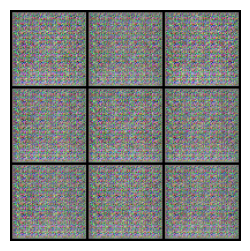

Epoch: 1/100 Batches: 0/41	Loss_D: 0.0243   Loss_G: 24.2771    D(x): 0.9881    D(G(z)): 0.0000 / 0.0000
Epoch: 2/100 Batches: 0/41	Loss_D: 0.4267   Loss_G: 8.7650    D(x): 0.8978    D(G(z)): 0.1689 / 0.0005
Epoch: 3/100 Batches: 0/41	Loss_D: 0.4963   Loss_G: 5.8759    D(x): 0.7268    D(G(z)): 0.0264 / 0.0043
Epoch: 4/100 Batches: 0/41	Loss_D: 0.6237   Loss_G: 7.0209    D(x): 0.8969    D(G(z)): 0.3507 / 0.0027
Epoch: 5/100 Batches: 0/41	Loss_D: 0.4415   Loss_G: 5.2512    D(x): 0.9424    D(G(z)): 0.2803 / 0.0096
Epoch: 6/100 Batches: 0/41	Loss_D: 0.6055   Loss_G: 4.2842    D(x): 0.8455    D(G(z)): 0.2987 / 0.0326
Epoch: 7/100 Batches: 0/41	Loss_D: 0.6063   Loss_G: 3.2278    D(x): 0.7392    D(G(z)): 0.2032 / 0.0757
Epoch: 8/100 Batches: 0/41	Loss_D: 1.0650   Loss_G: 4.8959    D(x): 0.4922    D(G(z)): 0.0195 / 0.0198
Epoch: 9/100 Batches: 0/41	Loss_D: 1.0724   Loss_G: 3.2590    D(x): 0.4525    D(G(z)): 0.0167 / 0.1196
Epoch: 10/100 Batches: 0/41	Loss_D: 0.3465   Loss_G: 4.8959    D(x): 0.8

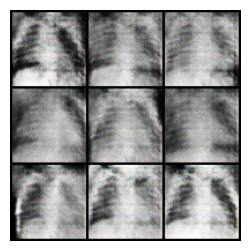

Epoch: 11/100 Batches: 0/41	Loss_D: 0.3994   Loss_G: 3.8819    D(x): 0.7852    D(G(z)): 0.0996 / 0.0461
Epoch: 12/100 Batches: 0/41	Loss_D: 0.5003   Loss_G: 6.1120    D(x): 0.8837    D(G(z)): 0.2773 / 0.0095
Epoch: 13/100 Batches: 0/41	Loss_D: 0.9394   Loss_G: 8.8413    D(x): 0.9589    D(G(z)): 0.5382 / 0.0035
Epoch: 14/100 Batches: 0/41	Loss_D: 0.5378   Loss_G: 5.6782    D(x): 0.9091    D(G(z)): 0.3216 / 0.0141
Epoch: 15/100 Batches: 0/41	Loss_D: 1.1694   Loss_G: 1.9285    D(x): 0.4388    D(G(z)): 0.0275 / 0.1963
Epoch: 16/100 Batches: 0/41	Loss_D: 0.3184   Loss_G: 3.8789    D(x): 0.9070    D(G(z)): 0.1698 / 0.0420
Epoch: 17/100 Batches: 0/41	Loss_D: 0.3399   Loss_G: 4.6745    D(x): 0.8992    D(G(z)): 0.1671 / 0.0388
Epoch: 18/100 Batches: 0/41	Loss_D: 1.0132   Loss_G: 5.3549    D(x): 0.4455    D(G(z)): 0.0112 / 0.0689
Epoch: 19/100 Batches: 0/41	Loss_D: 0.2892   Loss_G: 4.2982    D(x): 0.8872    D(G(z)): 0.1316 / 0.0242
Epoch: 20/100 Batches: 0/41	Loss_D: 0.3916   Loss_G: 5.1620    D

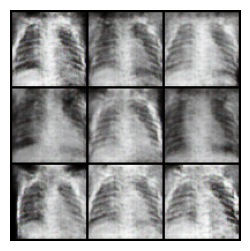

Epoch: 21/100 Batches: 0/41	Loss_D: 0.4804   Loss_G: 4.9852    D(x): 0.8237    D(G(z)): 0.1964 / 0.0366
Epoch: 22/100 Batches: 0/41	Loss_D: 0.6222   Loss_G: 6.4758    D(x): 0.9047    D(G(z)): 0.3392 / 0.0113
Epoch: 23/100 Batches: 0/41	Loss_D: 0.3871   Loss_G: 4.5977    D(x): 0.8427    D(G(z)): 0.1504 / 0.0237
Epoch: 24/100 Batches: 0/41	Loss_D: 0.5972   Loss_G: 2.3590    D(x): 0.6530    D(G(z)): 0.0494 / 0.1515
Epoch: 25/100 Batches: 0/41	Loss_D: 0.3761   Loss_G: 5.7796    D(x): 0.9359    D(G(z)): 0.2295 / 0.0097
Epoch: 26/100 Batches: 0/41	Loss_D: 0.8485   Loss_G: 9.2337    D(x): 0.9603    D(G(z)): 0.5004 / 0.0009
Epoch: 27/100 Batches: 0/41	Loss_D: 0.5286   Loss_G: 7.2651    D(x): 0.9009    D(G(z)): 0.2927 / 0.0029
Epoch: 28/100 Batches: 0/41	Loss_D: 1.0127   Loss_G: 5.8978    D(x): 0.4810    D(G(z)): 0.0081 / 0.0269
Epoch: 29/100 Batches: 0/41	Loss_D: 0.3588   Loss_G: 4.8103    D(x): 0.7695    D(G(z)): 0.0348 / 0.0205
Epoch: 30/100 Batches: 0/41	Loss_D: 0.4935   Loss_G: 3.7121    D

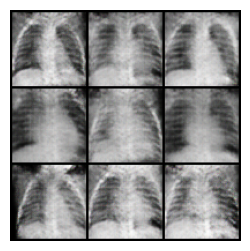

Epoch: 31/100 Batches: 0/41	Loss_D: 0.3723   Loss_G: 7.8815    D(x): 0.9102    D(G(z)): 0.1980 / 0.0016
Epoch: 32/100 Batches: 0/41	Loss_D: 0.4455   Loss_G: 7.2354    D(x): 0.9143    D(G(z)): 0.2610 / 0.0026
Epoch: 33/100 Batches: 0/41	Loss_D: 0.4950   Loss_G: 5.7993    D(x): 0.8638    D(G(z)): 0.2515 / 0.0146
Epoch: 34/100 Batches: 0/41	Loss_D: 0.3703   Loss_G: 5.9850    D(x): 0.9680    D(G(z)): 0.2568 / 0.0040
Epoch: 35/100 Batches: 0/41	Loss_D: 0.3604   Loss_G: 4.7984    D(x): 0.7650    D(G(z)): 0.0211 / 0.0251
Epoch: 36/100 Batches: 0/41	Loss_D: 0.3342   Loss_G: 3.5419    D(x): 0.7955    D(G(z)): 0.0361 / 0.0443
Epoch: 37/100 Batches: 0/41	Loss_D: 0.4370   Loss_G: 8.4410    D(x): 0.9621    D(G(z)): 0.2948 / 0.0006
Epoch: 38/100 Batches: 0/41	Loss_D: 0.5716   Loss_G: 8.4374    D(x): 0.9369    D(G(z)): 0.3563 / 0.0016
Epoch: 39/100 Batches: 0/41	Loss_D: 0.5009   Loss_G: 5.0394    D(x): 0.7556    D(G(z)): 0.0688 / 0.0261
Epoch: 40/100 Batches: 0/41	Loss_D: 0.9008   Loss_G: 10.2842    

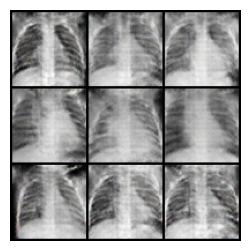

Epoch: 41/100 Batches: 0/41	Loss_D: 0.3612   Loss_G: 4.8958    D(x): 0.8714    D(G(z)): 0.1649 / 0.0161
Epoch: 42/100 Batches: 0/41	Loss_D: 0.9022   Loss_G: 9.4897    D(x): 0.9477    D(G(z)): 0.4736 / 0.0015
Epoch: 43/100 Batches: 0/41	Loss_D: 0.4238   Loss_G: 7.5241    D(x): 0.9358    D(G(z)): 0.2733 / 0.0038
Epoch: 44/100 Batches: 0/41	Loss_D: 0.3078   Loss_G: 3.6827    D(x): 0.8144    D(G(z)): 0.0554 / 0.0499
Epoch: 45/100 Batches: 0/41	Loss_D: 0.8525   Loss_G: 3.3433    D(x): 0.5673    D(G(z)): 0.0250 / 0.1141
Epoch: 46/100 Batches: 0/41	Loss_D: 0.2602   Loss_G: 5.0318    D(x): 0.9174    D(G(z)): 0.1378 / 0.0157
Epoch: 47/100 Batches: 0/41	Loss_D: 0.6738   Loss_G: 5.6179    D(x): 0.6142    D(G(z)): 0.0045 / 0.0214
Epoch: 48/100 Batches: 0/41	Loss_D: 0.6038   Loss_G: 8.0198    D(x): 0.9345    D(G(z)): 0.3570 / 0.0020
Epoch: 49/100 Batches: 0/41	Loss_D: 0.1763   Loss_G: 3.8473    D(x): 0.9305    D(G(z)): 0.0901 / 0.0400
Epoch: 50/100 Batches: 0/41	Loss_D: 0.7195   Loss_G: 9.2358    D

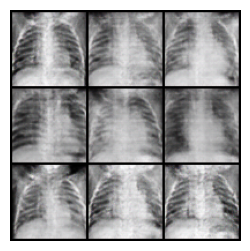

Epoch: 51/100 Batches: 0/41	Loss_D: 0.5445   Loss_G: 9.1247    D(x): 0.9759    D(G(z)): 0.3498 / 0.0006
Epoch: 52/100 Batches: 0/41	Loss_D: 0.1573   Loss_G: 5.0348    D(x): 0.9131    D(G(z)): 0.0491 / 0.0144
Epoch: 53/100 Batches: 0/41	Loss_D: 0.3477   Loss_G: 3.4077    D(x): 0.7721    D(G(z)): 0.0376 / 0.0963
Epoch: 54/100 Batches: 0/41	Loss_D: 0.2288   Loss_G: 5.1131    D(x): 0.9834    D(G(z)): 0.1695 / 0.0200
Epoch: 55/100 Batches: 0/41	Loss_D: 0.3416   Loss_G: 3.8026    D(x): 0.8111    D(G(z)): 0.0642 / 0.0457
Epoch: 56/100 Batches: 0/41	Loss_D: 0.2704   Loss_G: 4.1919    D(x): 0.8339    D(G(z)): 0.0478 / 0.0302
Epoch: 57/100 Batches: 0/41	Loss_D: 0.1978   Loss_G: 5.2274    D(x): 0.9327    D(G(z)): 0.1046 / 0.0117
Epoch: 58/100 Batches: 0/41	Loss_D: 0.2569   Loss_G: 4.1626    D(x): 0.8894    D(G(z)): 0.0955 / 0.0260
Epoch: 59/100 Batches: 0/41	Loss_D: 0.6322   Loss_G: 4.5040    D(x): 0.6793    D(G(z)): 0.0298 / 0.0586
Epoch: 60/100 Batches: 0/41	Loss_D: 0.3238   Loss_G: 6.1864    D

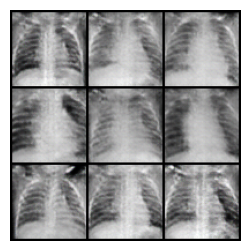

Epoch: 61/100 Batches: 0/41	Loss_D: 0.1893   Loss_G: 4.6082    D(x): 0.9659    D(G(z)): 0.1296 / 0.0169
Epoch: 62/100 Batches: 0/41	Loss_D: 0.3223   Loss_G: 3.9225    D(x): 0.8018    D(G(z)): 0.0268 / 0.0386
Epoch: 63/100 Batches: 0/41	Loss_D: 0.4898   Loss_G: 4.6077    D(x): 0.7793    D(G(z)): 0.1070 / 0.0333
Epoch: 64/100 Batches: 0/41	Loss_D: 0.5247   Loss_G: 8.6471    D(x): 0.9828    D(G(z)): 0.3367 / 0.0006
Epoch: 65/100 Batches: 0/41	Loss_D: 0.5674   Loss_G: 3.0294    D(x): 0.6670    D(G(z)): 0.0192 / 0.0917
Epoch: 66/100 Batches: 0/41	Loss_D: 0.1109   Loss_G: 5.2579    D(x): 0.9402    D(G(z)): 0.0420 / 0.0111
Epoch: 67/100 Batches: 0/41	Loss_D: 0.3597   Loss_G: 4.1041    D(x): 0.8289    D(G(z)): 0.0904 / 0.0353
Epoch: 68/100 Batches: 0/41	Loss_D: 0.3779   Loss_G: 6.6307    D(x): 0.9670    D(G(z)): 0.2611 / 0.0045
Epoch: 69/100 Batches: 0/41	Loss_D: 0.2519   Loss_G: 4.6626    D(x): 0.9475    D(G(z)): 0.1457 / 0.0208
Epoch: 70/100 Batches: 0/41	Loss_D: 0.7155   Loss_G: 8.1055    D

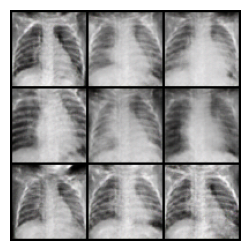

Epoch: 71/100 Batches: 0/41	Loss_D: 0.3057   Loss_G: 7.3229    D(x): 0.9739    D(G(z)): 0.2224 / 0.0039
Epoch: 72/100 Batches: 0/41	Loss_D: 0.2175   Loss_G: 3.0961    D(x): 0.8964    D(G(z)): 0.0785 / 0.0646
Epoch: 73/100 Batches: 0/41	Loss_D: 0.1757   Loss_G: 4.4642    D(x): 0.8944    D(G(z)): 0.0442 / 0.0219
Epoch: 74/100 Batches: 0/41	Loss_D: 0.2879   Loss_G: 7.0595    D(x): 0.9705    D(G(z)): 0.2094 / 0.0015
Epoch: 75/100 Batches: 0/41	Loss_D: 0.1941   Loss_G: 4.6531    D(x): 0.9225    D(G(z)): 0.0963 / 0.0156
Epoch: 76/100 Batches: 0/41	Loss_D: 0.0901   Loss_G: 5.0488    D(x): 0.9609    D(G(z)): 0.0412 / 0.0393
Epoch: 77/100 Batches: 0/41	Loss_D: 0.2513   Loss_G: 6.4773    D(x): 0.9900    D(G(z)): 0.1872 / 0.0064
Epoch: 78/100 Batches: 0/41	Loss_D: 0.1867   Loss_G: 5.1808    D(x): 0.8977    D(G(z)): 0.0593 / 0.0088
Epoch: 79/100 Batches: 0/41	Loss_D: 0.2551   Loss_G: 3.8574    D(x): 0.8744    D(G(z)): 0.0873 / 0.0327
Epoch: 80/100 Batches: 0/41	Loss_D: 0.1611   Loss_G: 4.9111    D

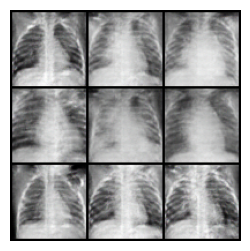

Epoch: 81/100 Batches: 0/41	Loss_D: 0.3120   Loss_G: 3.5961    D(x): 0.7946    D(G(z)): 0.0252 / 0.0686
Epoch: 82/100 Batches: 0/41	Loss_D: 0.2934   Loss_G: 3.2050    D(x): 0.8448    D(G(z)): 0.0759 / 0.0756
Epoch: 83/100 Batches: 0/41	Loss_D: 0.1811   Loss_G: 6.7747    D(x): 0.9881    D(G(z)): 0.1278 / 0.0039
Epoch: 84/100 Batches: 0/41	Loss_D: 0.3295   Loss_G: 6.1604    D(x): 0.9066    D(G(z)): 0.1780 / 0.0048
Epoch: 85/100 Batches: 0/41	Loss_D: 0.1892   Loss_G: 4.7336    D(x): 0.9321    D(G(z)): 0.1005 / 0.0137
Epoch: 86/100 Batches: 0/41	Loss_D: 0.2133   Loss_G: 4.8942    D(x): 0.9658    D(G(z)): 0.1462 / 0.0108
Epoch: 87/100 Batches: 0/41	Loss_D: 0.1428   Loss_G: 4.9418    D(x): 0.9164    D(G(z)): 0.0417 / 0.0133
Epoch: 88/100 Batches: 0/41	Loss_D: 0.0908   Loss_G: 5.1108    D(x): 0.9599    D(G(z)): 0.0443 / 0.0150
Epoch: 89/100 Batches: 0/41	Loss_D: 0.2526   Loss_G: 4.2105    D(x): 0.8353    D(G(z)): 0.0174 / 0.0387
Epoch: 90/100 Batches: 0/41	Loss_D: 0.1421   Loss_G: 6.2948    D

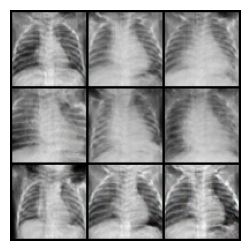

Epoch: 91/100 Batches: 0/41	Loss_D: 0.0877   Loss_G: 4.0303    D(x): 0.9421    D(G(z)): 0.0221 / 0.0272
Epoch: 92/100 Batches: 0/41	Loss_D: 0.8601   Loss_G: 12.0379    D(x): 0.9916    D(G(z)): 0.4066 / 0.0026
Epoch: 93/100 Batches: 0/41	Loss_D: 0.1288   Loss_G: 5.1381    D(x): 0.9594    D(G(z)): 0.0768 / 0.0096
Epoch: 94/100 Batches: 0/41	Loss_D: 0.2618   Loss_G: 6.5630    D(x): 0.9281    D(G(z)): 0.1400 / 0.0064
Epoch: 95/100 Batches: 0/41	Loss_D: 0.1283   Loss_G: 5.5483    D(x): 0.9234    D(G(z)): 0.0373 / 0.0083
Epoch: 96/100 Batches: 0/41	Loss_D: 0.1388   Loss_G: 4.8562    D(x): 0.9324    D(G(z)): 0.0574 / 0.0167
Epoch: 97/100 Batches: 0/41	Loss_D: 0.2580   Loss_G: 4.6301    D(x): 0.9064    D(G(z)): 0.1129 / 0.0206
Epoch: 98/100 Batches: 0/41	Loss_D: 0.3799   Loss_G: 8.8145    D(x): 0.9363    D(G(z)): 0.2030 / 0.0039
Epoch: 99/100 Batches: 0/41	Loss_D: 0.5083   Loss_G: 3.1941    D(x): 0.7248    D(G(z)): 0.0314 / 0.1010


In [19]:
# Load 9 images
nb_images = 9
nb_row = math.ceil(math.sqrt(nb_images))

# Training Loop
data_len = len(dataloader)

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []


# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader (depends on batch_size and your number of images)
    for i, data in enumerate(dataloader, 0):

        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))

        ## Train with all-real batch
        disc_net.zero_grad()
        # Format batch
        real_cpu = data['image'].to(device)
        #real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = disc_net(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = gen_net(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = disc_net(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        # (2) Update G network: maximize log(D(G(z)))

        gen_net.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = disc_net(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # (3) Metrics & Evaluation

        # Print output training stats every 50 batches (if your dataset is large, printing at every epoch might be less frequent than you want)
        if i % 50 == 0:
            print(f"Epoch: {epoch}/{num_epochs} Batches: {i}/{data_len}\tLoss_D: {errD.item():.4f}   Loss_G: {errG.item():.4f}    D(x): {D_x:.4f}    D(G(z)): {D_G_z1:.4f} / {D_G_z2:.4f}")

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

    # Generate fake images to see how the generator is doing by saving G's output on fixed_noise at each epoch (fixed noise allow to obtain similar images).
    if show_images == True and epoch % 10 == 0:
        with torch.no_grad():
            # Uncomment the line below to generate a new variety of images every time
            #fixed_noise = torch.randn(64, nz, 1, 1, device=device)

            fake = gen_net(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake[:nb_images], padding=2, normalize=True, nrow=nb_row))

            plt.figure(figsize=(3, 3))
            plt.axis("off")
            plt.imshow(np.transpose(img_list[-1], (1, 2, 0)))

            if save_images == True:
                plt.savefig(f'images/epoch_{epoch}_gen_images.png')

            # Display image
            plt.show()

    # Save models each 5 epochs
    if epoch % 5 == 0:
        if save_model:
            save_dcgan(gen_net, disc_net, path_checkpoint=f"models/chest_epoch_{epoch}_checkpoint.pkl")

# Save the final models
save_dcgan(gen_net, disc_net, path_checkpoint="models/chest_final_epoch_checkpoint.pkl")

## Let's look at a plot of the losses

We can see that the Generator loss starts very high, as it is initalized with random noise.  Conversely, the Discriminator loss is comparatively low since the images are random noise and obviously fake. As the Generator improves, it's loss decreases as it becomes harder for the Discriminator to distinquish between real and fake images (and conversely the Discriminator loss increases). During training, the Generator and Discriminator continue this adversarial process, and we see that the losses eventually stablize and fluctuate as one or the other improves.  

Ideally, we would like the model to achieve a balance where the Generator is producing high-quality images that are challenging for the Discriminator, resulting in both low Generator and Discriminator losses.


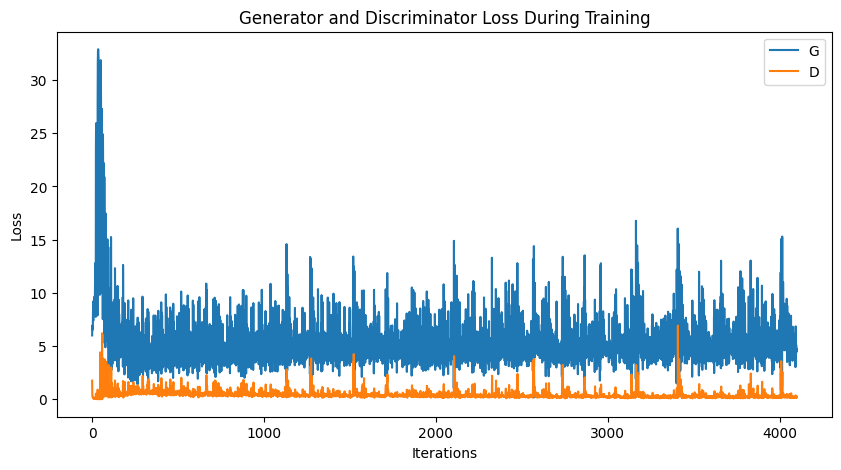

In [20]:
from IPython.display import HTML
import matplotlib.animation as animation
import matplotlib.pyplot as plt

plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

### We will create an animation to visualize the training.

In [21]:
# increase the default limit set by Matplotlib for embedding animations
import matplotlib
matplotlib.rcParams['animation.embed_limit'] = 100  # 100 MB

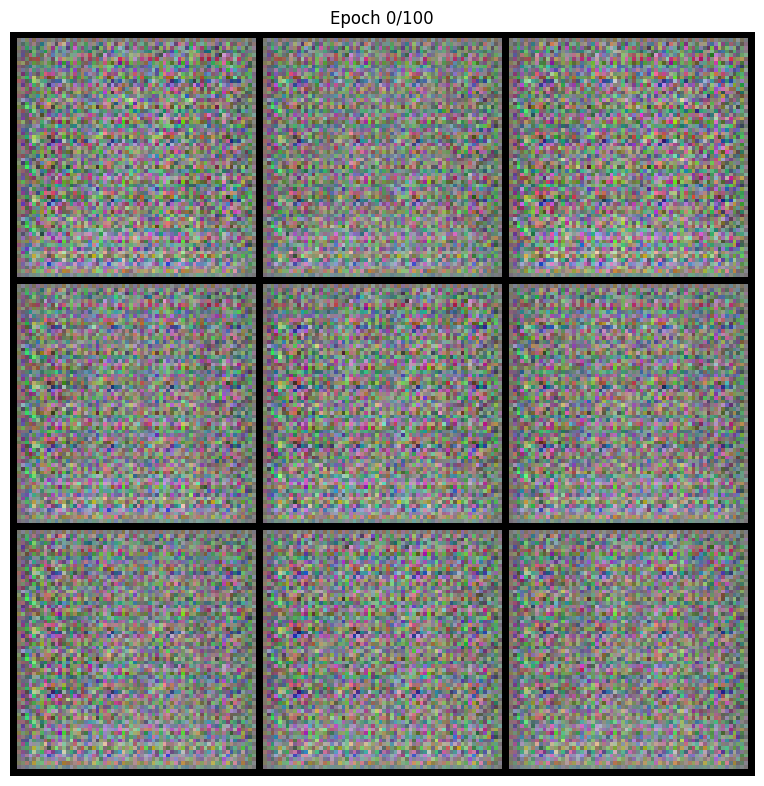

In [22]:
fig = plt.figure(figsize=(8, 8))
plt.axis("off")
plt.tight_layout(pad=2.0, h_pad=2.0, w_pad=2.0)

# Initial empty title and image
title = plt.title("")
img_plot = plt.imshow(np.transpose(img_list[0], (1, 2, 0)), animated=True)

def update_title_and_image(frame):
    img_plot.set_array(np.transpose(img_list[frame], (1, 2, 0)))
    title.set_text(f"Epoch {frame}/{num_epochs}")

ani = animation.FuncAnimation(fig, update_title_and_image, frames=len(img_list), interval=100, repeat_delay=5000)

# Display animation
HTML(ani.to_jshtml())

In [23]:
# Save the animation as a GIF
ani.save('images/dcgan_training_animation.gif', writer='pillow')

### Let's use our model to create some synthetic lung images.

In [24]:
# Specify desired weights path
path_checkpoint = "models/chest_final_epoch_checkpoint.pkl"

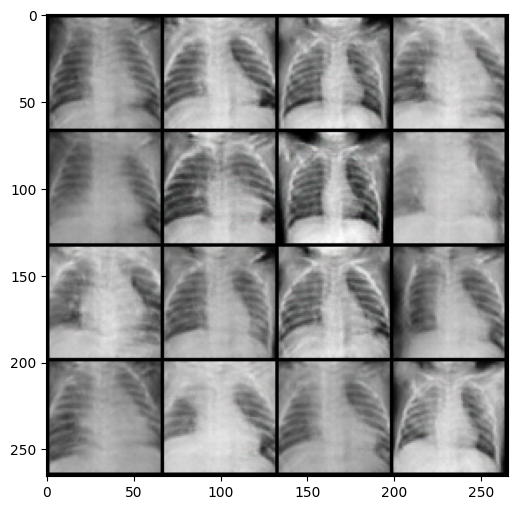

In [25]:
# Number of desired images
num_img = 16
nb_row = math.ceil(math.sqrt(num_img))

# Create a random noise
random_noise = torch.randn(num_img, nz, 1, 1, device=device)

# Instantiate a generator
new_gen= Generator(nb_gpu).to(device)

# Handle multi-GPU if desired
if (device.type == 'cuda') and (nb_gpu > 1):
    new_gen = nn.DataParallel(new_gen, list(range(nb_gpu)))

# Load weights from path
checkpoint = torch.load(path_checkpoint, map_location="cpu")
state_dict_g = checkpoint["g_model_state_dict"]
new_gen.load_state_dict(state_dict_g)

# Generate images
with torch.no_grad():
    fake_data = new_gen(random_noise).detach().cpu()

# Plot images
img_grid = vutils.make_grid(fake_data, padding=2, normalize=True, nrow=nb_row).cpu()
img_grid = np.transpose(img_grid, (1, 2, 0))
plt.figure(figsize=(6, 6))
plt.imshow(img_grid)
plt.show()

Next, we will instantiate a new Discrminator from our saved model.

In [26]:
# Instantiate a discriminator
new_dis= Discriminator(nb_gpu).to(device)

# Handle multi-GPU if desired
if (device.type == 'cuda') and (nb_gpu > 1):
    new_dis = nn.DataParallel(new_dis, list(range(nb_gpu)))

# Load weights from path
checkpoint = torch.load(path_checkpoint, map_location="cpu")
state_dict_d = checkpoint["d_model_state_dict"]
new_dis.load_state_dict(state_dict_d)

<All keys matched successfully>

We will use our new generator to create some synthetic lung images. The new discriminator will give us the probability that a synthetic lung image is real.  If the probability is greater than a threshold (in our case 70%), we will add it to an array of "good" images.  

We can see that some of the "good" images are blurry.  This highlights why it is critical to have an expert radiologist evaluate the synthetic lung images!

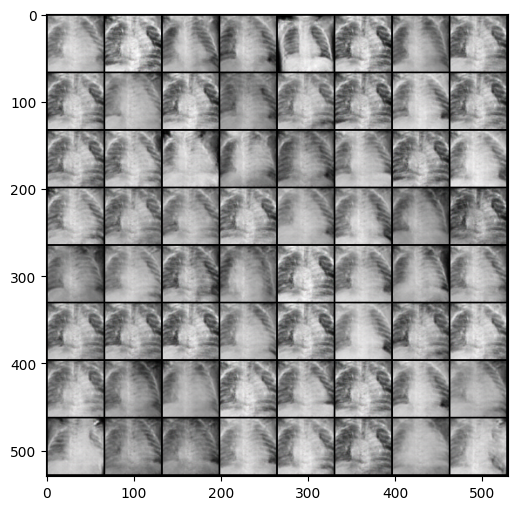

In [27]:
# Set threshold
threshold = 0.70


# Create list to store the images classified as >= threshold
pass_threshold = []

while len(pass_threshold)<64:
    # Create a random noise
    random_noise = torch.randn(num_img, nz, 1, 1, device=device)
    # Generate images for this noise
    with torch.no_grad():
        fake_data = new_gen(random_noise)

        # Set the discriminator to eval mode
        new_dis.eval()

        # Pass the generated fake_data through the discriminator & obtain real/fake probabilities
        output_probabilities = new_dis(fake_data)

    # Create mask (If prob < threshold, set to False, else True)
    good_image_mask = output_probabilities >= threshold

    # Remove extra tensor dims (torch.Size([16, 1, 1, 1]) -> torch.Size([16]))
    good_image_mask = good_image_mask.squeeze()

    # Keep the selected images
    good_images = fake_data[good_image_mask > threshold]

    # If good_images is not None
    if good_images.numel() > 0:
        # Loop through the tensor along the first dimension (index 0), since we have x images in a torch.Size([x, 3, 64, 64]) object
        for i in range(good_images.size(0)):
            # Add selected images
            pass_threshold.append(good_images[i])

# Plot selected images
img_grid = vutils.make_grid(pass_threshold, padding=2, normalize=True, nrow=8).cpu()
img_grid = np.transpose(img_grid, (1, 2, 0))
plt.figure(figsize=(6, 6))
plt.imshow(img_grid)
plt.show()

**Citation:**

Kermany, Daniel; Zhang, Kang; Goldbaum, Michael (2018), “Labeled Optical Coherence Tomography (OCT) and Chest X-Ray Images for Classification”, Mendeley Data, V2, doi: 10.17632/rscbjbr9sj.2
